https://arxiv.org/pdf/1501.00092.pdf
Following that

In [1]:
!git clone https://github.com/niazwazir/SRCNN_KERAS_TRAINING_PHOTOS.git

Cloning into 'SRCNN_KERAS_TRAINING_PHOTOS'...
remote: Enumerating objects: 76, done.
remote: Counting objects: 100% (76/76), done.
remote: Compressing objects: 100% (59/59), done.
remote: Total 76 (delta 17), reused 76 (delta 17), pack-reused 0
Unpacking objects: 100% (76/76), done.


In [2]:
!ls

sample_data  SRCNN_KERAS_TRAINING_PHOTOS


In [3]:
cd SRCNN_KERAS_TRAINING_PHOTOS/

/content/SRCNN_KERAS_TRAINING_PHOTOS


In [4]:
!ls

example_input  prediction.py  Single_Image_SR.ipynb  training.py
model.py       README.md      SR_percep.h5	     utils.py


In [5]:
import keras
from keras import layers
from keras import models
import tensorflow as tf
import numpy as np
import cv2
import glob
import os
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt
from keras import backend as K

# The generator


In [6]:
from keras.utils import Sequence
class Generator(Sequence):
    def __init__(self,images,batch_size,insize = 64,outsize = 240,factor = 4,pretrained = None):
        
        self.image_set = images
        self.batch_size = batch_size
        self.len = int(np.ceil(len(self.image_set)/self.batch_size))
        self.insize = (insize,insize)
        self.model_in = (insize*factor,insize*factor)
        self.start = int((insize*factor-outsize)/2)
        self.end = self.start+outsize
        self.pretrained = pretrained
        
    def __len__(self):
        return int(self.len)

    def __getitem__(self, idx):
        y = []
        x = []
        current_list = self.image_set[int(idx * self.batch_size): int((idx + 1) * self.batch_size)]
        for img in current_list:
            image = cv2.imread(img)
            in_image = cv2.resize(image,self.insize)
            in_image = cv2.resize(in_image,self.model_in)
            out_image = cv2.resize(image,self.model_in)
            out_image = out_image[self.start:self.end,self.start:self.end,:]
            x.append(in_image.astype(np.float32))
            y.append(out_image.astype(np.float32))
        
        x = np.asarray(x)
        y = np.asarray(y)
        if self.pretrained is not None:
            outputs = self.pretrained(y)
            # y = {}
            # for i,layer in enumerate(pretrained_multi_output.output_names):
            #     y[layer] = outputs[i]
            y = outputs

        return x/255.0,y/255.0

# Using mobile net for perceptual loss

Could also try out Xception or the more standard VGG16, although it is quite huge

In [7]:
from keras.applications import MobileNet

pretrained = MobileNet(input_shape = (None,None,3),
                       include_top = False,
                       weights = 'imagenet')

layer_for_perception_loss = [4,7,14,67,-1] # mobilenet layers

pretrained_multi_output = models.Model(pretrained.input,outputs = [pretrained.layers[i].output for i in layer_for_perception_loss],name = 'perception')
pretrained_multi_output.trainable = False


def percep_loss(y_true,y_pred):
    c_true = pretrained_multi_output(y_true)
    c_pred = pretrained_multi_output(y_pred)
    loss = 0
    for p,t in zip(c_true,c_pred):
        loss+=K.mean(K.square(p-t))
    return loss

17227776/17225924 [==============================] - 0s 0us/step


# The model


In [8]:
class SuperResolution:
    def __init__(self,n1,f1,n2,f2,f3,pretrained = None):
        self.model = self.create_model(n1,f1,n2,f2,f3)
        if pretrained!=None:
            inp = layers.Input(shape = (None,None,3),name = 'SR_input')
            out = self.model(inp)
            percep_out = pretrained(out)
            self.model_w_percep = models.Model(inp,outputs = [out,percep_out],name = "SR_w_percep")

    def create_patch(self,n,f,name,tensor):
        x = layers.Conv2D(filters=n,kernel_size=(f,f),name = name,
                          padding='valid',use_bias=True)(tensor)
        x = layers.BatchNormalization()(x)
        x = layers.LeakyReLU(alpha=0.1)(x)
        return x

    def create_model(self,n1,f1,n2,f2,f3):
        inp = layers.Input(shape = (None,None,3)) # input

        x = self.create_patch(n1,f1,'patch_extraction',inp)

        x = self.create_patch(n2,f2,'nonlinear_mapping',x)

        # reconstruction needs none of the relu stuff
        out = layers.Conv2D(filters=3,kernel_size=(f3,f3),name ='reconstruction',
                          padding='valid',use_bias=True)(x)

        out = K.sigmoid(out)

        return models.Model(inp,out,name = "SR")

In [9]:
!ls

example_input  prediction.py  Single_Image_SR.ipynb  training.py
model.py       README.md      SR_percep.h5	     utils.py


In [10]:
!git clone https://github.com/niazwazir/DATASETS.git

Cloning into 'DATASETS'...
remote: Enumerating objects: 1423, done.
remote: Total 1423 (delta 0), reused 0 (delta 0), pack-reused 1423
Receiving objects: 100% (1423/1423), 388.60 MiB | 35.87 MiB/s, done.
Resolving deltas: 100% (617/617), done.


# The training

In [11]:
from keras.callbacks import ModelCheckpoint,EarlyStopping,ReduceLROnPlateau,LambdaCallback
from keras.optimizers import Adam


# Some model settings
f1 = 9
f2 = 5
f3 = 5
learn_rate = 0.001
decay_plateau = 0.5

# The model
SR = SuperResolution(n1 = 64,f1 = f1,
                     n2 = 32, f2 = f2,
                     f3 = f3)
optimizer = Adam(lr = learn_rate)
SR.model.compile(loss = percep_loss,optimizer=optimizer)


# The generator
img_list = glob.glob('DATASETS/data/bsd200/*.*')
# lvl1 generator
train_3 = Generator(img_list,32,
                    insize = 64,
                    outsize = 64*4 -f1-f2-f3+3,
                    factor = 4)

Epoch 1/100
7/7 [==============================] - 14s 469ms/step - loss: 32.0478


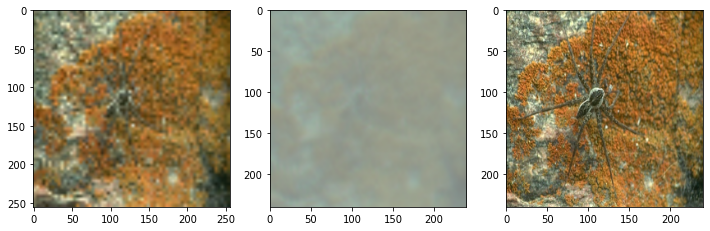

Epoch 2/100
7/7 [==============================] - 3s 357ms/step - loss: 16.2195


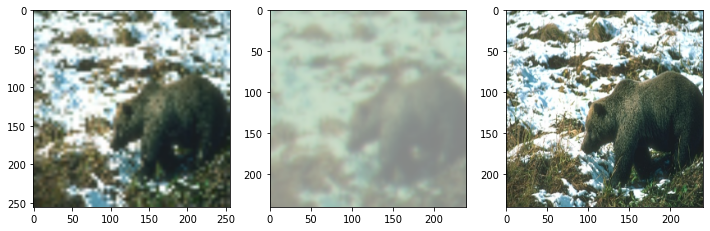

Epoch 3/100
7/7 [==============================] - 3s 338ms/step - loss: 14.7679


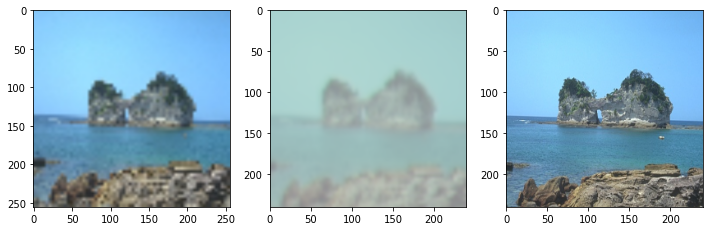

Epoch 4/100
7/7 [==============================] - 3s 358ms/step - loss: 14.2899


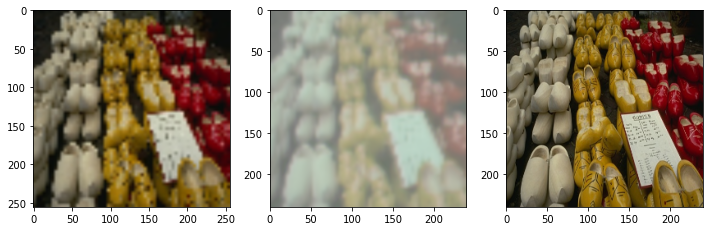

Epoch 5/100
7/7 [==============================] - 3s 359ms/step - loss: 13.6379


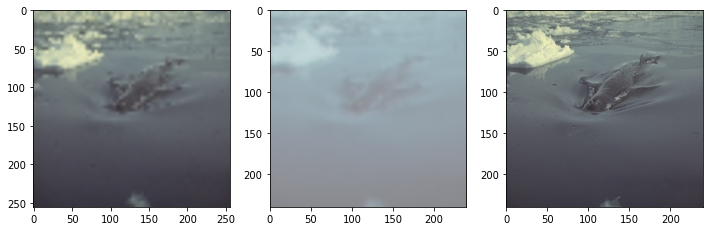

Epoch 6/100
7/7 [==============================] - 3s 363ms/step - loss: 13.5104


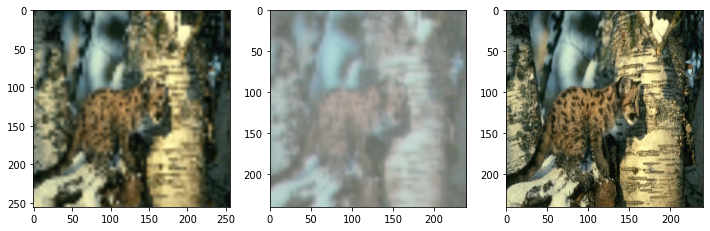

Epoch 7/100
7/7 [==============================] - 3s 347ms/step - loss: 13.1583


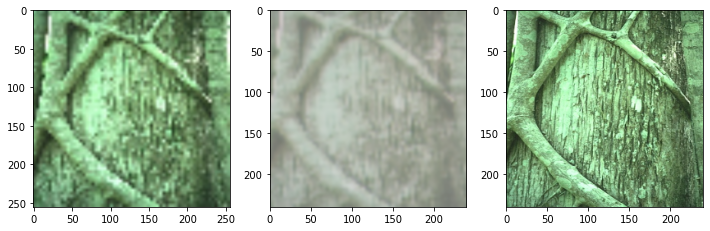

Epoch 8/100
7/7 [==============================] - 3s 367ms/step - loss: 13.3285


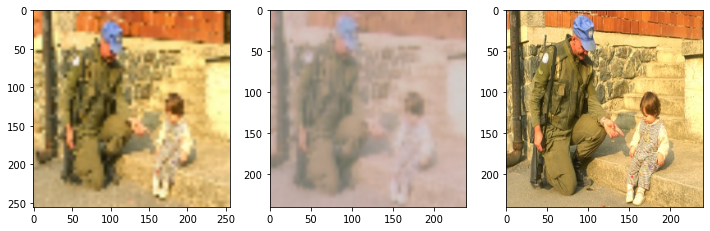

Epoch 9/100
7/7 [==============================] - 3s 347ms/step - loss: 12.8617


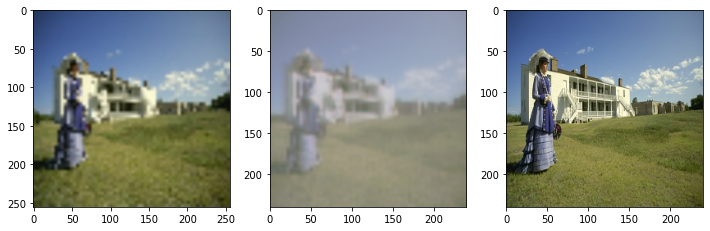

Epoch 10/100
7/7 [==============================] - 3s 413ms/step - loss: 12.9006

Epoch 00010: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.


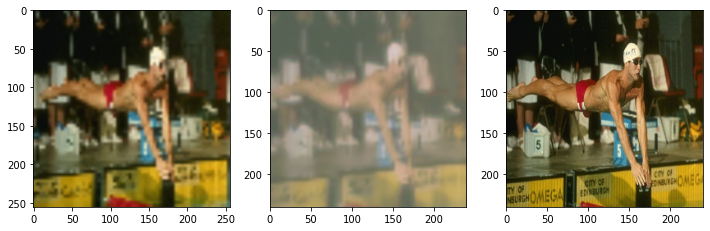

Epoch 11/100
7/7 [==============================] - 3s 363ms/step - loss: 12.7104


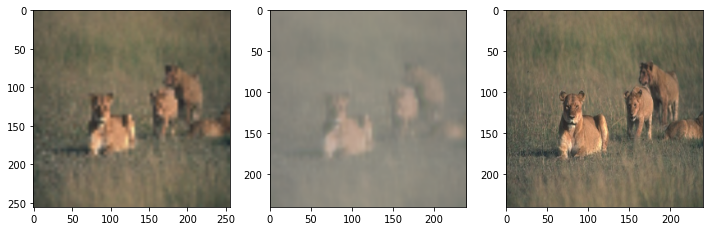

Epoch 12/100
7/7 [==============================] - 3s 364ms/step - loss: 12.6340


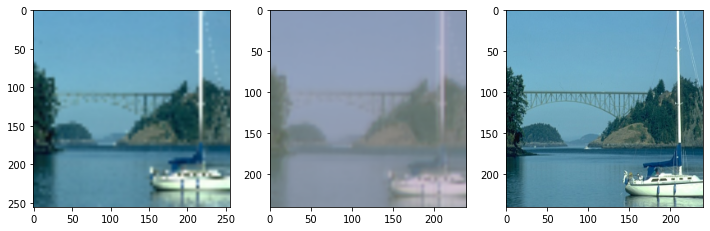

Epoch 13/100
7/7 [==============================] - 3s 362ms/step - loss: 12.3006


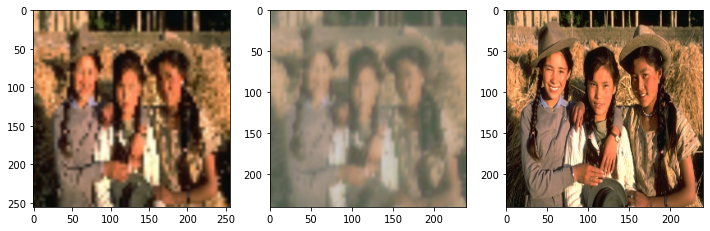

Epoch 14/100
7/7 [==============================] - 3s 369ms/step - loss: 12.6415


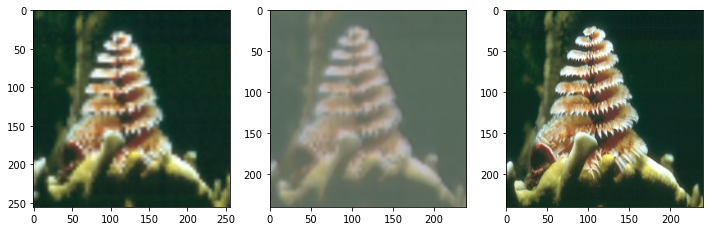

Epoch 15/100
7/7 [==============================] - 3s 374ms/step - loss: 12.4248


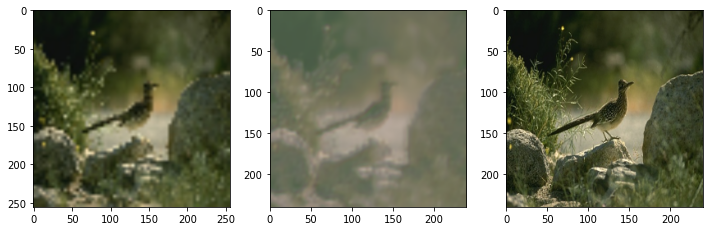

Epoch 16/100
7/7 [==============================] - 3s 366ms/step - loss: 12.2599


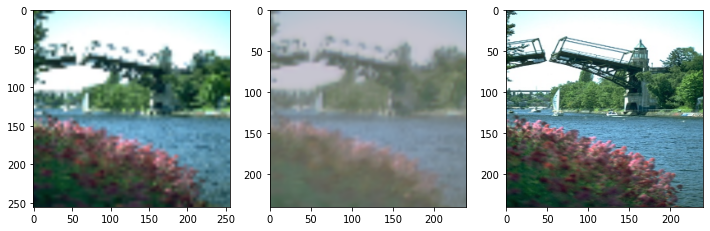

Epoch 17/100
7/7 [==============================] - 3s 372ms/step - loss: 12.3895


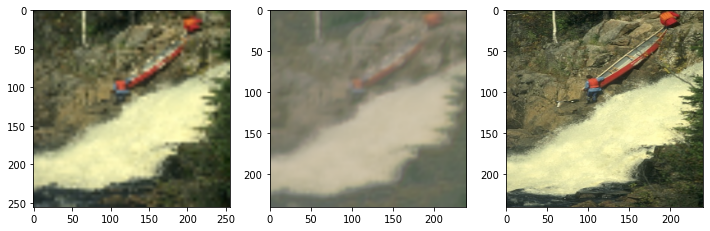

Epoch 18/100
7/7 [==============================] - 3s 374ms/step - loss: 12.3492

Epoch 00018: ReduceLROnPlateau reducing learning rate to 0.0002500000118743628.


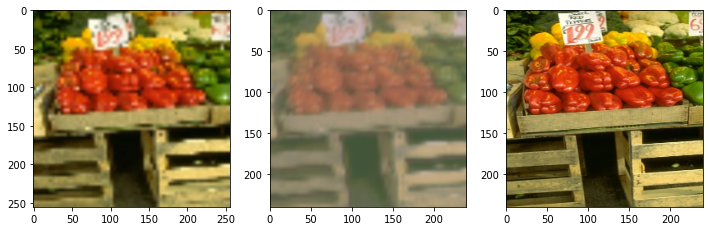

Epoch 19/100
7/7 [==============================] - 3s 374ms/step - loss: 12.1075


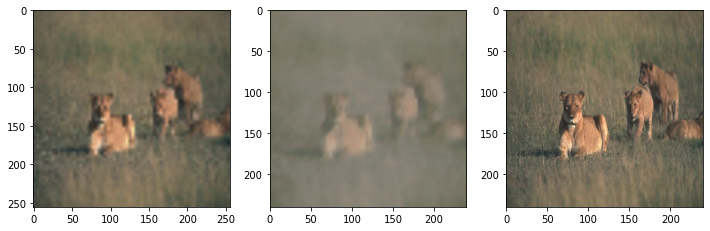

Epoch 20/100
7/7 [==============================] - 3s 348ms/step - loss: 12.4570


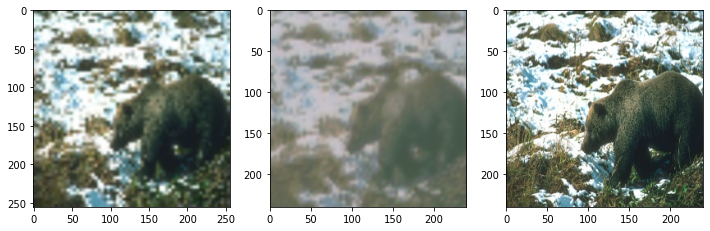

Epoch 21/100
7/7 [==============================] - 3s 368ms/step - loss: 12.3568


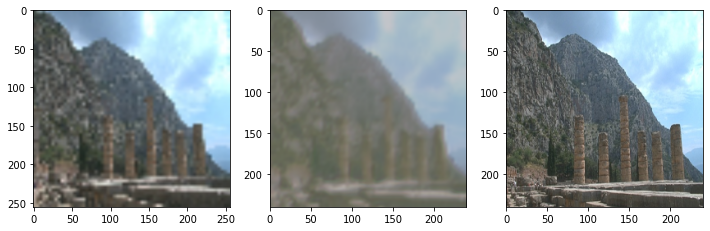

Epoch 22/100
7/7 [==============================] - 3s 346ms/step - loss: 12.0785

Epoch 00022: ReduceLROnPlateau reducing learning rate to 0.0001250000059371814.


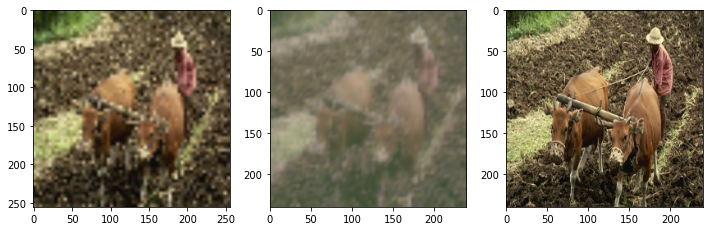

Epoch 23/100
7/7 [==============================] - 3s 348ms/step - loss: 12.2399


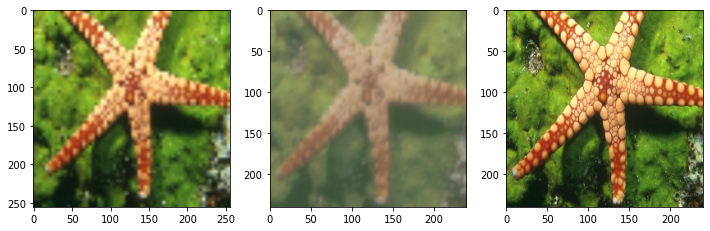

Epoch 24/100
7/7 [==============================] - 3s 369ms/step - loss: 12.5001


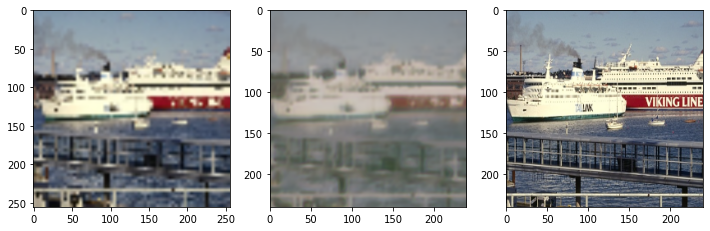

Epoch 25/100
7/7 [==============================] - 3s 376ms/step - loss: 12.0011

Epoch 00025: ReduceLROnPlateau reducing learning rate to 6.25000029685907e-05.


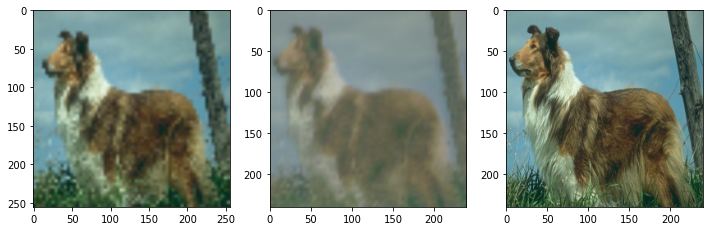

Epoch 26/100
7/7 [==============================] - 3s 357ms/step - loss: 12.0721


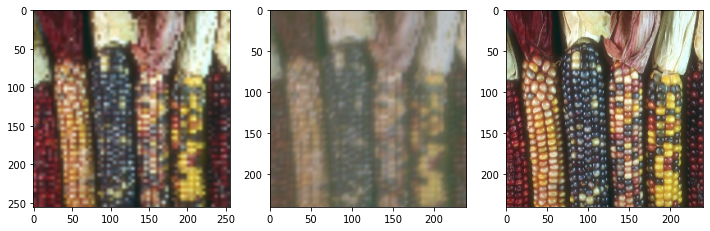

Epoch 27/100
7/7 [==============================] - 3s 353ms/step - loss: 12.1234

Epoch 00027: ReduceLROnPlateau reducing learning rate to 3.125000148429535e-05.


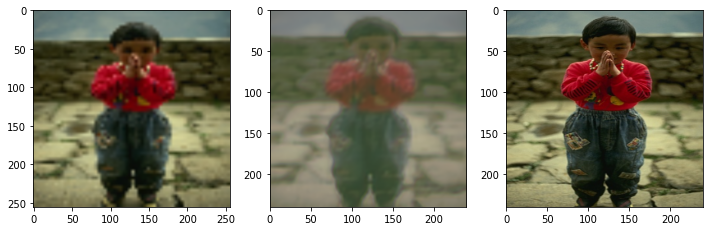

Epoch 28/100
7/7 [==============================] - 3s 372ms/step - loss: 12.3878


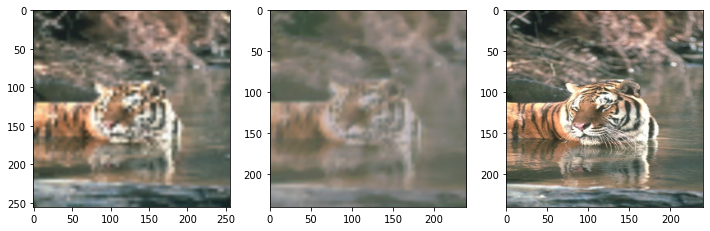

Epoch 29/100
7/7 [==============================] - 3s 374ms/step - loss: 12.3425


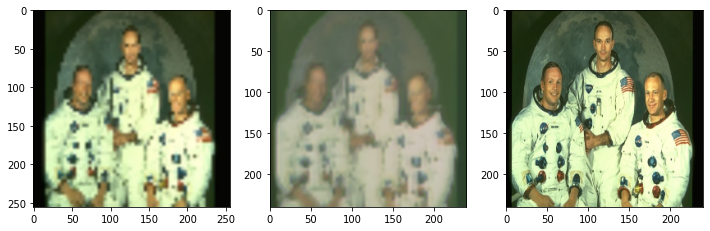

Epoch 30/100
7/7 [==============================] - 3s 417ms/step - loss: 12.2360


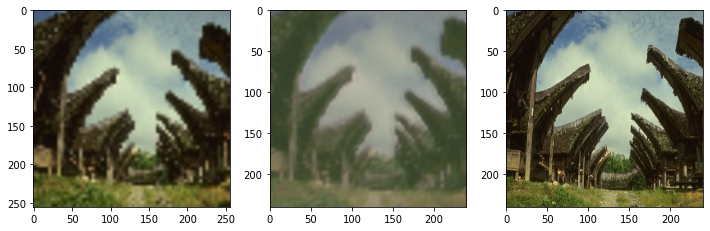

Epoch 31/100
7/7 [==============================] - 3s 375ms/step - loss: 12.1949


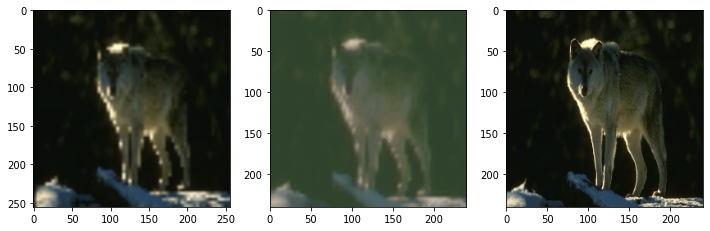

Epoch 32/100
7/7 [==============================] - 3s 380ms/step - loss: 12.1552


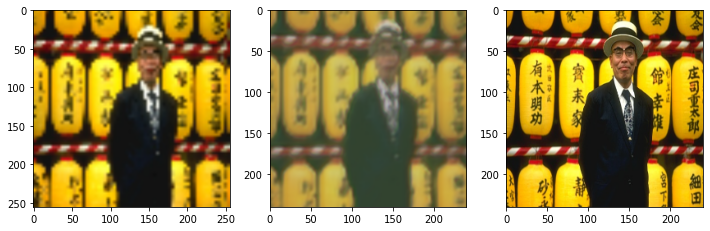

Epoch 33/100
7/7 [==============================] - 3s 376ms/step - loss: 12.3420

Epoch 00033: ReduceLROnPlateau reducing learning rate to 1.5625000742147677e-05.


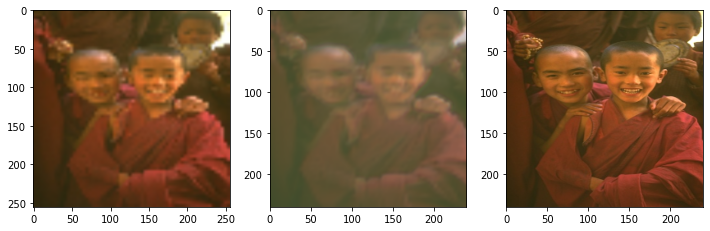

Epoch 34/100
7/7 [==============================] - 3s 378ms/step - loss: 12.2567


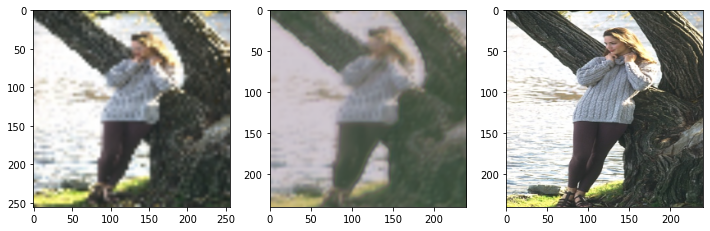

Epoch 35/100
7/7 [==============================] - 3s 379ms/step - loss: 12.1663


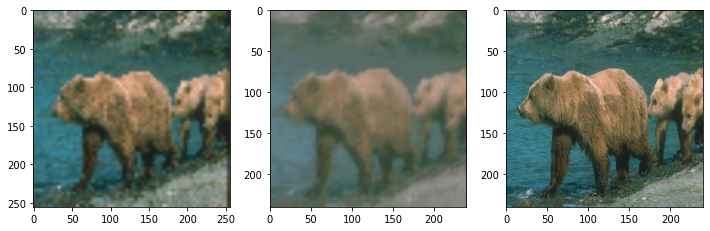

Epoch 36/100
7/7 [==============================] - 3s 378ms/step - loss: 12.2599


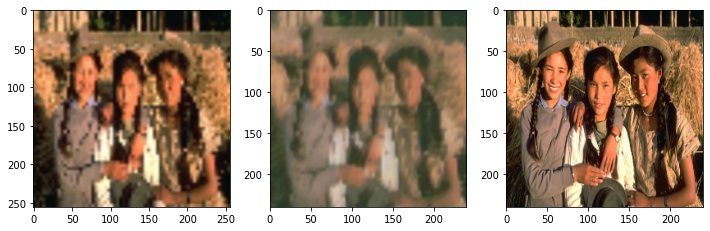

Epoch 37/100
7/7 [==============================] - 3s 427ms/step - loss: 12.3780


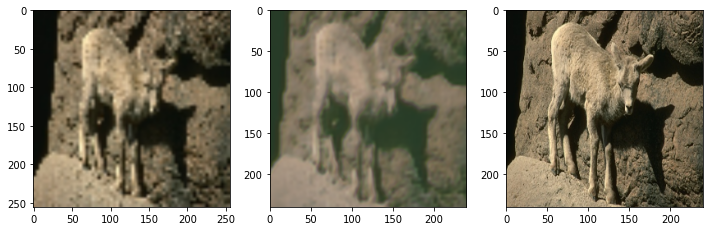

Epoch 38/100
7/7 [==============================] - 3s 380ms/step - loss: 12.3828


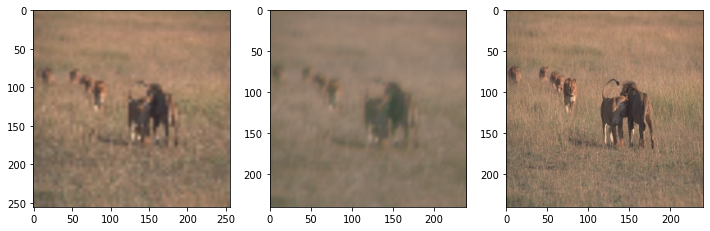

Epoch 39/100
7/7 [==============================] - 3s 383ms/step - loss: 12.1396

Epoch 00039: ReduceLROnPlateau reducing learning rate to 7.812500371073838e-06.


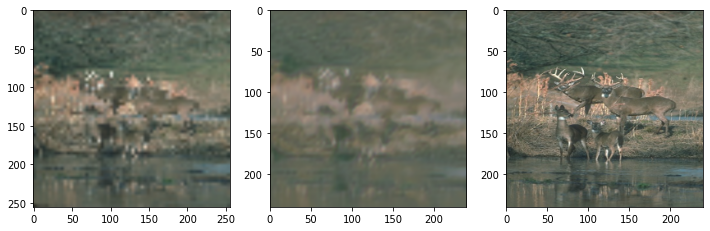

Epoch 40/100
7/7 [==============================] - 3s 424ms/step - loss: 12.2233


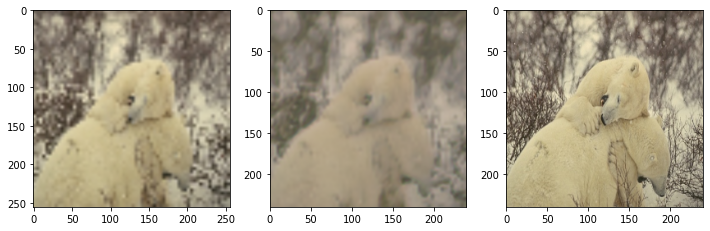

Epoch 41/100
7/7 [==============================] - 3s 386ms/step - loss: 12.2531


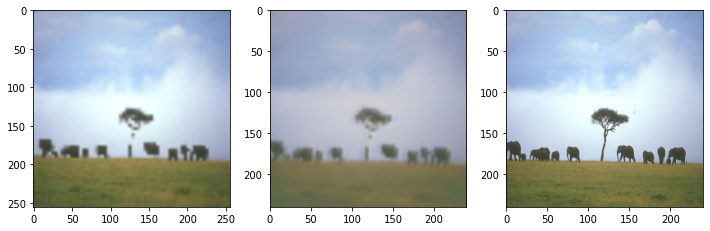

Epoch 42/100
7/7 [==============================] - 3s 386ms/step - loss: 12.0938

Epoch 00042: ReduceLROnPlateau reducing learning rate to 3.906250185536919e-06.


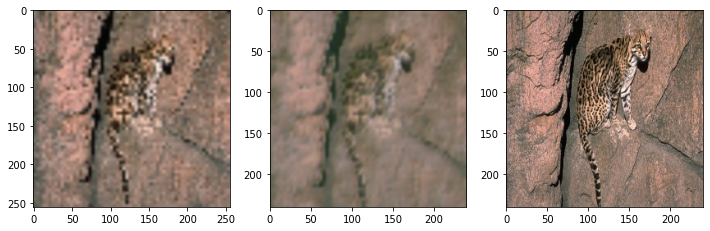

Epoch 43/100
7/7 [==============================] - 3s 428ms/step - loss: 12.4032


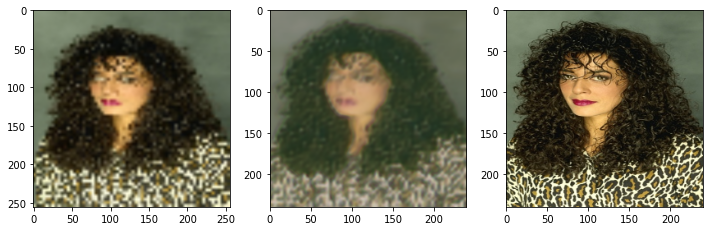

Epoch 44/100
7/7 [==============================] - 3s 391ms/step - loss: 12.1337


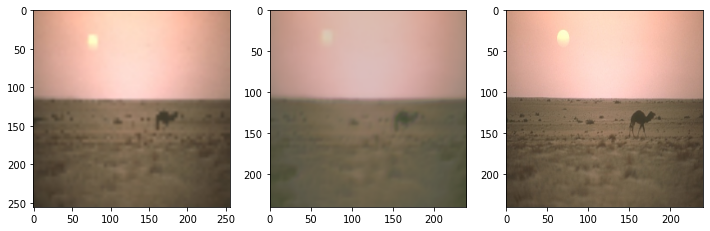

Epoch 45/100
7/7 [==============================] - 3s 351ms/step - loss: 12.2017

Epoch 00045: ReduceLROnPlateau reducing learning rate to 1.9531250927684596e-06.


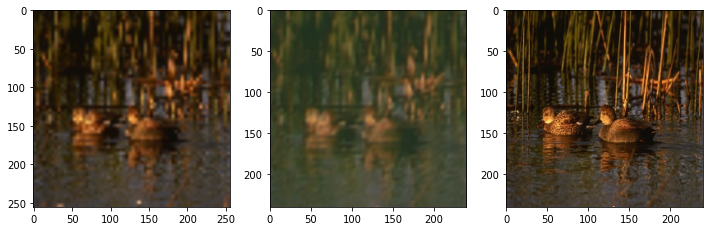

Epoch 46/100
7/7 [==============================] - 3s 385ms/step - loss: 12.0755


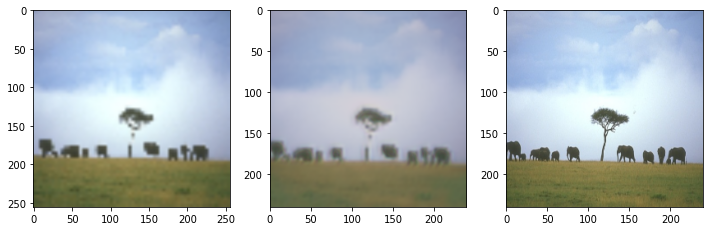

Epoch 47/100
7/7 [==============================] - 3s 389ms/step - loss: 12.3970


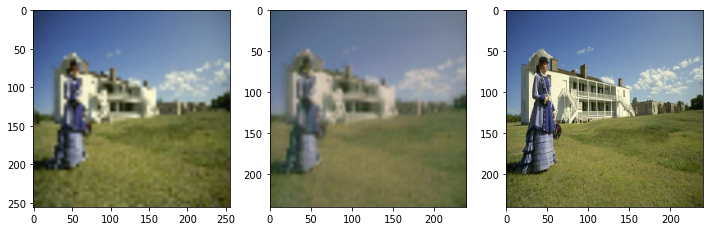

Epoch 48/100
7/7 [==============================] - 3s 382ms/step - loss: 12.1877

Epoch 00048: ReduceLROnPlateau reducing learning rate to 9.765625463842298e-07.


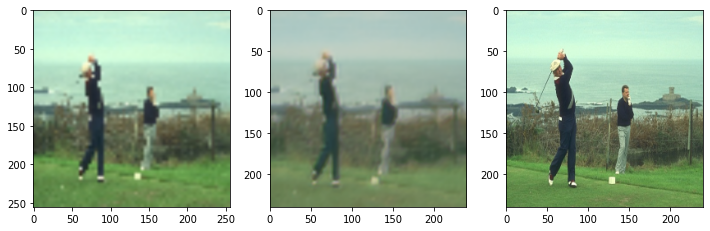

Epoch 49/100
7/7 [==============================] - 3s 442ms/step - loss: 12.3379


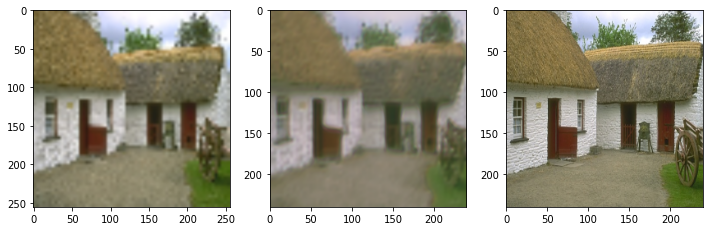

Epoch 50/100
7/7 [==============================] - 3s 384ms/step - loss: 12.1530


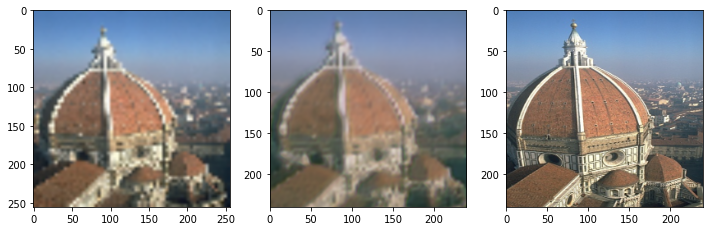

Epoch 51/100
7/7 [==============================] - 3s 380ms/step - loss: 12.4049

Epoch 00051: ReduceLROnPlateau reducing learning rate to 4.882812731921149e-07.


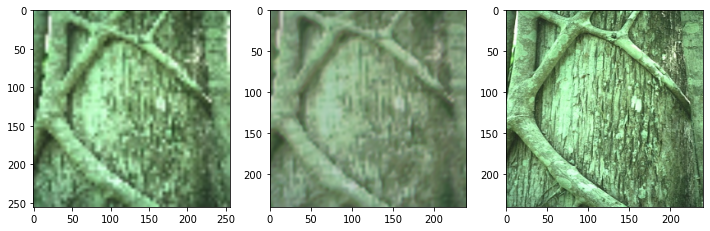

Epoch 52/100
7/7 [==============================] - 3s 430ms/step - loss: 12.1642


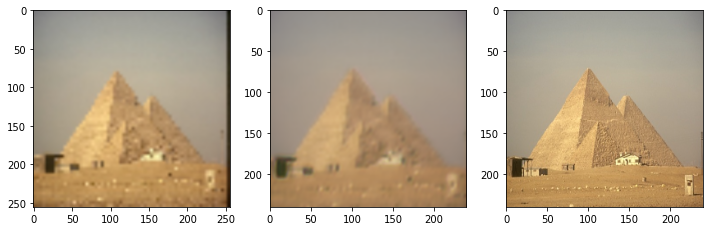

Epoch 53/100
7/7 [==============================] - 3s 392ms/step - loss: 12.2291

Epoch 00053: ReduceLROnPlateau reducing learning rate to 2.4414063659605745e-07.


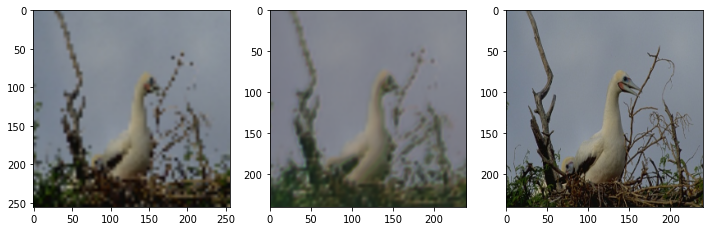

Epoch 54/100
7/7 [==============================] - 3s 392ms/step - loss: 12.2091

Epoch 00054: ReduceLROnPlateau reducing learning rate to 1.2207031829802872e-07.


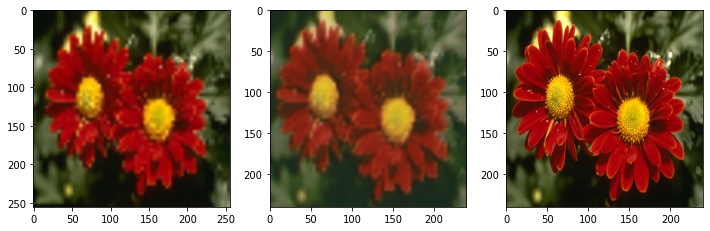

Epoch 55/100
7/7 [==============================] - 3s 379ms/step - loss: 12.1486


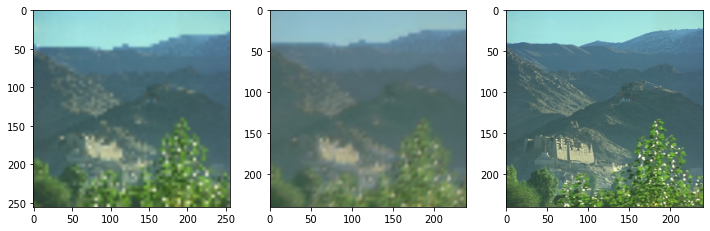

Epoch 56/100
7/7 [==============================] - 3s 390ms/step - loss: 12.3443

Epoch 00056: ReduceLROnPlateau reducing learning rate to 6.103515914901436e-08.


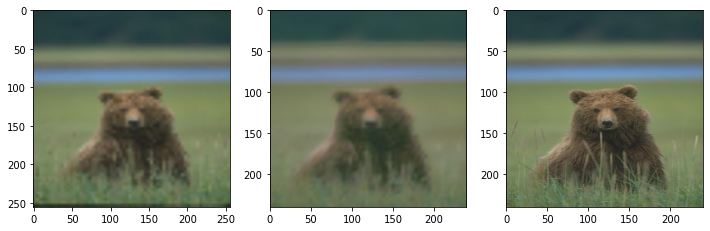

Epoch 57/100
7/7 [==============================] - 3s 390ms/step - loss: 12.2032

Epoch 00057: ReduceLROnPlateau reducing learning rate to 3.051757957450718e-08.


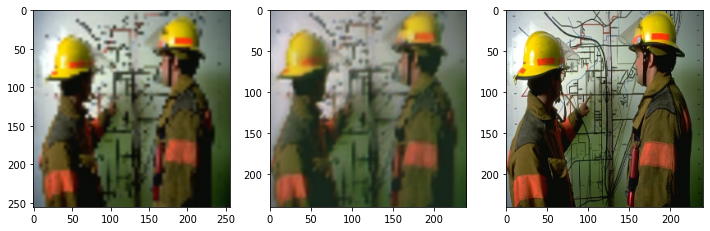

Epoch 58/100
7/7 [==============================] - 3s 394ms/step - loss: 12.2619

Epoch 00058: ReduceLROnPlateau reducing learning rate to 1.525878978725359e-08.


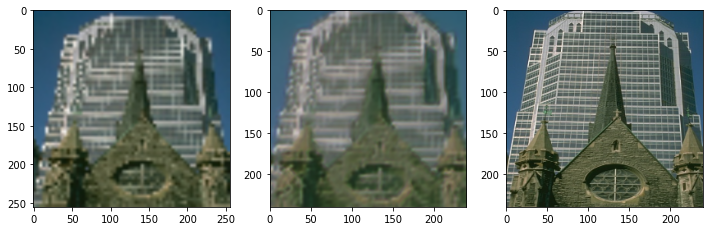

Epoch 59/100
7/7 [==============================] - 3s 383ms/step - loss: 12.1957

Epoch 00059: ReduceLROnPlateau reducing learning rate to 1e-08.


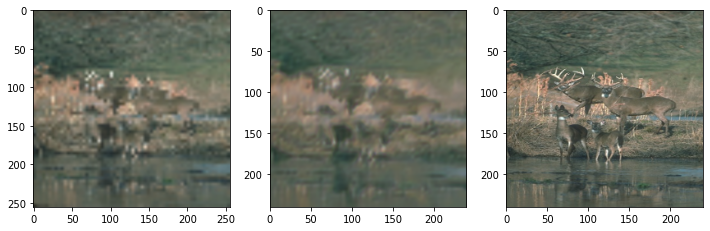

Epoch 60/100
7/7 [==============================] - 3s 388ms/step - loss: 12.1946


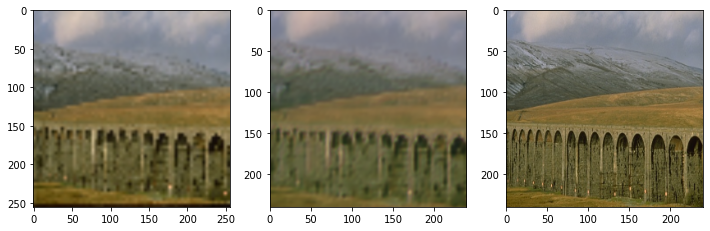

Epoch 61/100
7/7 [==============================] - 3s 443ms/step - loss: 12.1251


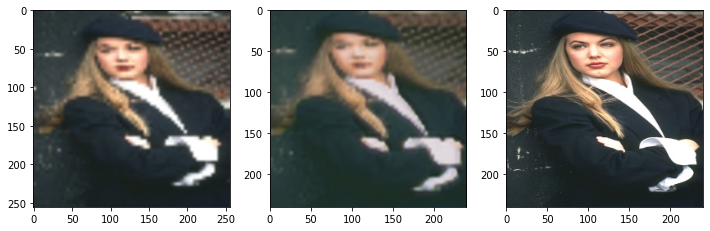

Epoch 62/100
7/7 [==============================] - 3s 380ms/step - loss: 12.1315


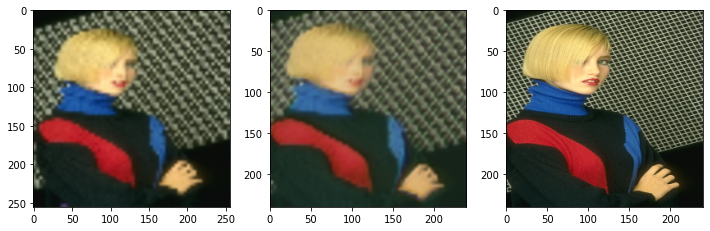

Epoch 63/100
7/7 [==============================] - 3s 382ms/step - loss: 12.2993


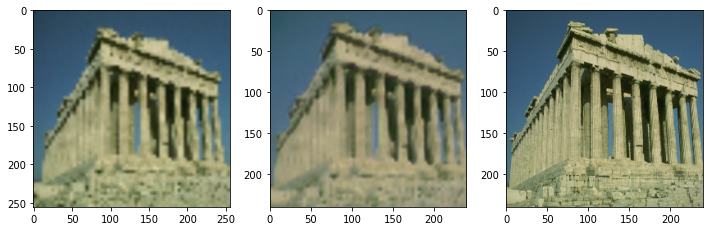

Epoch 64/100
7/7 [==============================] - 3s 429ms/step - loss: 12.2640


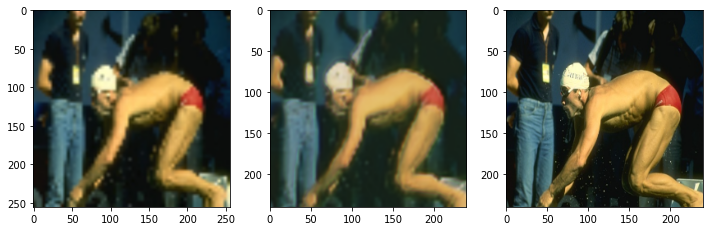

Epoch 65/100
7/7 [==============================] - 3s 354ms/step - loss: 12.2642


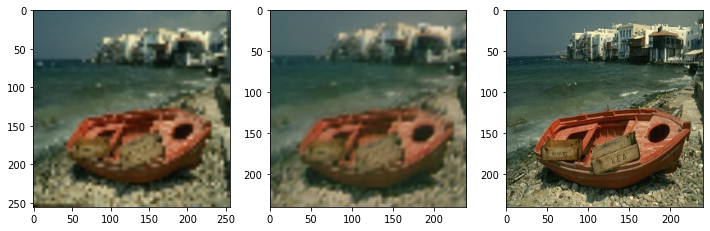

Epoch 66/100
7/7 [==============================] - 3s 393ms/step - loss: 12.4044


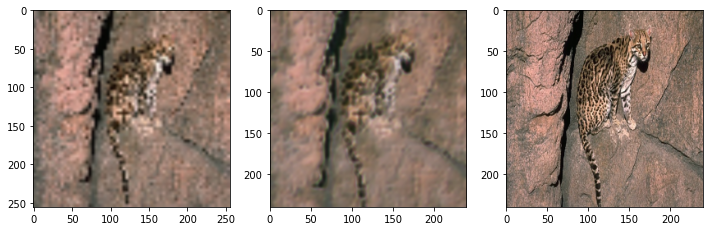

Epoch 67/100
7/7 [==============================] - 3s 390ms/step - loss: 12.3141


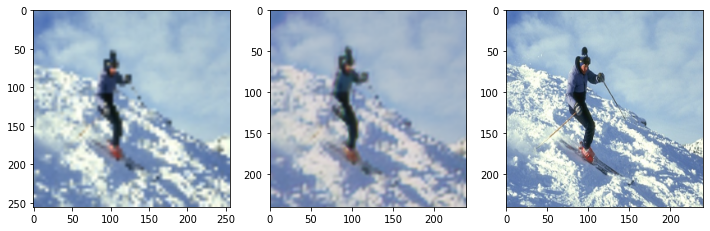

Epoch 68/100
7/7 [==============================] - 3s 378ms/step - loss: 12.2687


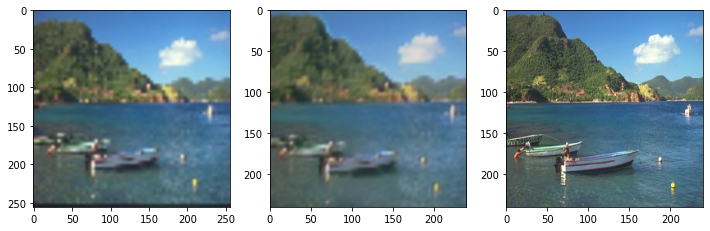

Epoch 69/100
7/7 [==============================] - 3s 375ms/step - loss: 12.1595


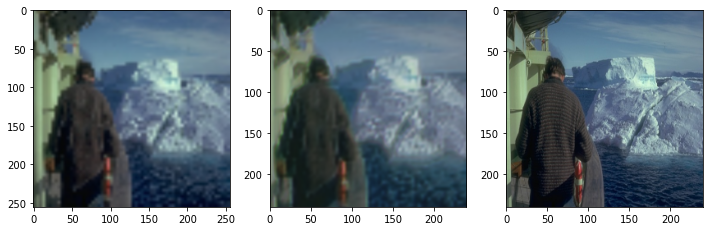

Epoch 70/100
7/7 [==============================] - 3s 389ms/step - loss: 12.0976


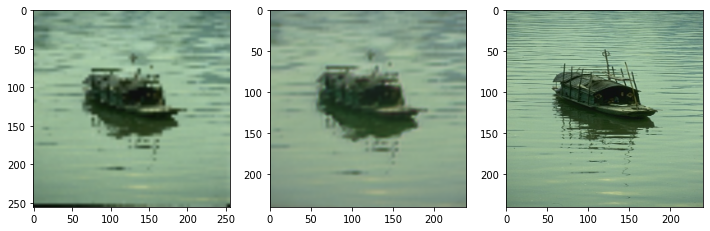

Epoch 00070: early stopping


In [12]:
# checkpoints for various stuff

percep_ckpt = ModelCheckpoint('/content/drive/My Drive/Single_Image_SR/SR_percep.h5',monitor = 'loss',save_best_only=True,mode = 'min')
early_stop_cb = EarlyStopping(monitor='loss',
                           min_delta=1e-6,
                           patience=3,
                           mode='min',
                           verbose=1)
lr_reduce = ReduceLROnPlateau(monitor = 'loss',factor = decay_plateau,patience = 0,min_lr = 1e-8,verbose = 1)
def plot(epoch,train = train_3): # change the generator if needed
    x,pred = train[np.random.randint(0,len(train)-1)]
    y = SR.model.predict(x)
    idx = np.random.randint(0,train.batch_size)
    in_img = (x[idx]*255).astype(np.uint8)
    out_img = (y[idx]*255).astype(np.uint8)
    truth = (pred[idx]*255).astype(np.uint8)
    fig=plt.figure(figsize=(12, 4))
    fig.add_subplot(1,3,1)
    plt.imshow(in_img[:,:,::-1])
    fig.add_subplot(1,3,2)
    plt.imshow(out_img[:,:,::-1])
    fig.add_subplot(1,3,3)
    plt.imshow(truth[:,:,::-1])
    plt.show()


    
show_visual = LambdaCallback(
    on_epoch_end= lambda epoch,logs:  plot(epoch)
)
callback = [percep_ckpt,early_stop_cb,lr_reduce,show_visual]



# Train the model on level 1
SR.model.fit(x = train_3,
             epochs = 100,
             callbacks = callback)